In [69]:
from imports import *
from loss_functions import *
from loading_data import *
from general_plotting import *
from fixed_bins import * 
from interpolation import *
from neural_network import * 
# to get access to logdust function
%run 'simulation.py'
# plot in-line within the notebook
%matplotlib inline 

finished running simulation


In [90]:
from matplotlib import rcParams
rcParams.update({'xtick.major.pad': '7.0'})
rcParams.update({'xtick.major.size': '7.5'})
rcParams.update({'xtick.major.width': '1.5'})
rcParams.update({'xtick.minor.pad': '7.0'})
rcParams.update({'xtick.minor.size': '3.5'})
rcParams.update({'xtick.minor.width': '1.0'})
rcParams.update({'ytick.major.pad': '7.0'})
rcParams.update({'ytick.major.size': '7.5'})
rcParams.update({'ytick.major.width': '1.5'})
rcParams.update({'ytick.minor.pad': '7.0'})
rcParams.update({'ytick.minor.size': '3.5'})
rcParams.update({'ytick.minor.width': '1.0'})
rcParams.update({'axes.titlepad': '15.0'})
rcParams.update({'axes.labelpad': '15.0'})
rcParams.update({'font.size': 20})
matplotlib.rc('text', usetex=True)
matplotlib.rcParams['text.latex.preamble']=r'\usepackage{amsmath}'

In [3]:
def pol2cart(r, theita):
    '''Return cartesian coordinate from polar coordinate'''
    x = r * np.cos(theita)
    y = r * np.sin(theita)
    return [x, y]

def polWithTwise2cart(r, x_over_r, y_over_r):
    '''Return cartesian coordinate from polar coordinate'''
    x = r * x_over_r #np.cos(theita)
    y = r * y_over_r #np.sin(theita)
    return [x, y]

def cart2pol(x, y):
    '''Return polar coordinate from cartesian coordinate'''
    r = np.sqrt(x**2 + y**2)
    phi = np.arctan2(y, x)
    return [r, phi]

In [ ]:
model, train_loss, val_loss = train_NN_model(error=False, num_input=2)  

In [5]:
model = tf.keras.models.load_model('gelu_model_cartesion')
# model.save("gelu_model_cartesion")

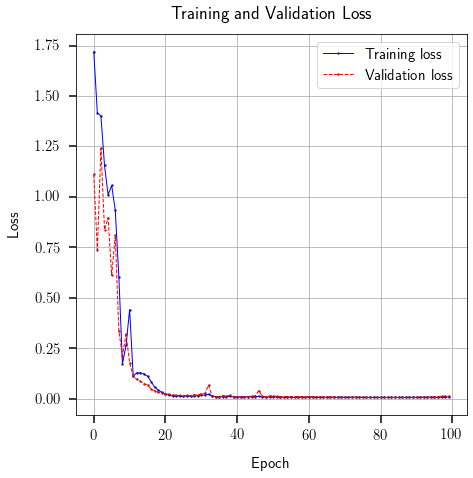

In [76]:
plt.figure(figsize=(7, 7)) 
plt.plot(train_loss, label='Training loss', color='blue', linestyle='-', linewidth = 1, marker = 'o', ms = 2, markeredgecolor='black', markeredgewidth=0.2)
plt.plot(val_loss, label='Validation loss', color='red', linestyle='dashed', linewidth = 1, marker = 'o', ms = 2, markeredgecolor='black', markeredgewidth=0.2)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.title('Training and Validation Loss')
plt.savefig('6.png', bbox_inches='tight')

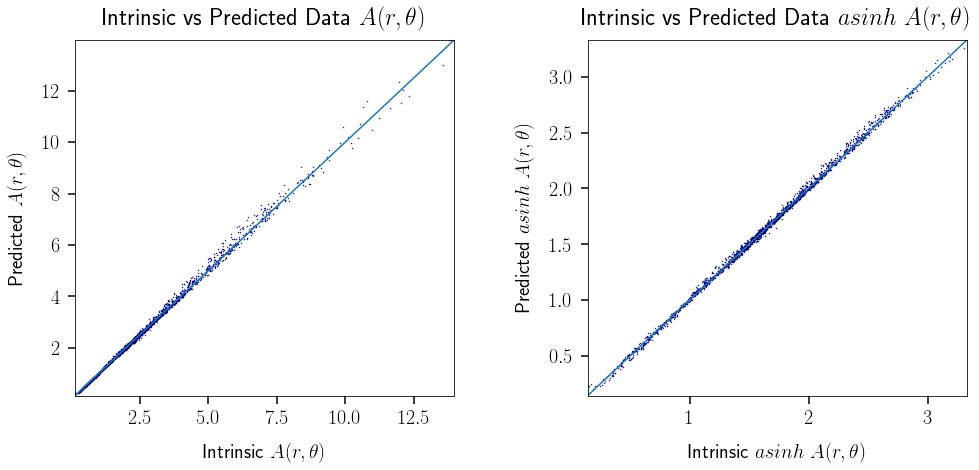

In [77]:
plt.figure(figsize=(15, 8))
#plotting the loss as a function of log A on the x and y axes. This helps to stretch out the axes, since the errors scale proportional to A
rcParams.update({'font.size': 20})
pred = get_NN_pred(model, X_test)
pred_asinh = np.arcsinh(pred)
Y_test_asinh = np.arcsinh(Y_test)
plt.subplot(1, 2, 1)
plt.scatter(Y_test, pred, s=1, color='blue', linestyle='-', linewidth = 0.2, marker = 'D', edgecolor='black') 
plt.xlabel("Intrinsic " + r'$A(r, \theta)$')
plt.ylabel("Predicted " + r'$A(r, \theta)$')
lims = [min(np.amin(Y_test), np.amin(pred)), max(np.amax(Y_test), np.amax(pred))]
plt.xlim(lims)
plt.ylim(lims)
plt.plot(lims, lims)
plt.title('Intrinsic vs Predicted Data ' +  r'$A(r, \theta)$')
plt.subplot(1, 2, 2)
plt.scatter(Y_test_asinh, pred_asinh, s=1, color='blue', linestyle='-', linewidth = 0.2, marker = 'D', edgecolor='black') 
plt.xlabel("Intrinsic " + r'$asinh$' + ' ' +  r'$A(r, \theta)$')
plt.ylabel("Predicted " + r'$asinh$' + ' ' +  r'$A(r, \theta)$')
lims = [min(np.amin(Y_test_asinh), np.amin(pred_asinh)), max(np.amax(Y_test_asinh), np.amax(pred_asinh))]
plt.xlim(lims)
plt.ylim(lims)
plt.plot(lims, lims)
plt.title('Intrinsic vs Predicted Data ' +  r'$asinh$' + ' ' +  r'$A(r, \theta)$')
plt.tight_layout(pad=3.0)
# plt.savefig('plots/typicalintrinsicvspredicted1.png', bbox_inches='tight')
plt.savefig('2.png', bbox_inches='tight')

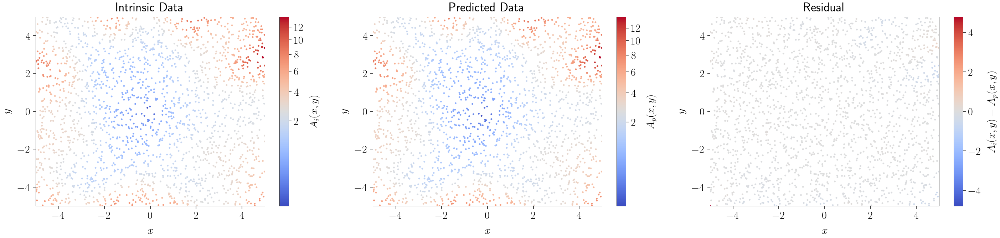

In [81]:
X_test_cart = np.copy(X_test)
xlim, ylim = [X_MIN, X_MAX], [Y_MIN, Y_MAX]
rcParams.update({'font.size': 30})
applyPlotStyle2()
fig, ax = plt.subplots(1, 3, figsize=(40,10))
pcm = ax[0].scatter(X_test_cart[:, 0], X_test_cart[:, 1], c=Y_test, norm=matplotlib.colors.PowerNorm(gamma=.4), cmap='coolwarm', s = 15)
ax[0].set_xlabel(r'$x$')
ax[0].set_ylabel(r'$y$')
ax[0].set_xlim(xlim)
ax[0].set_ylim(ylim)
ax[0].set_title('Intrinsic Data')
fig.colorbar(pcm, ax=ax[0], label=r'$A_i(x, y)$') 
pcm = ax[1].scatter(X_test_cart[:, 0], X_test_cart[:, 1], c=pred, norm=matplotlib.colors.PowerNorm(gamma=.4), cmap='coolwarm', s = 15)
ax[1].set_xlabel(r'$x$')
ax[1].set_ylabel(r'$y$')
ax[1].set_xlim(xlim)
ax[1].set_ylim(ylim)
ax[1].set_title('Predicted Data')
fig.colorbar(pcm, ax=ax[1], label=r'$A_p(x, y)$') 
pcm = ax[2].scatter(np.append(X_test_cart[:, 0], [-5, -5]), np.append(X_test_cart[:, 1], [-5, -5]), c=np.append(Y_test - pred,(-4.7967, 4.7967)), cmap='coolwarm', s = 15)
ax[2].set_xlabel(r'$x$')
ax[2].set_ylabel(r'$y$')
ax[2].set_xlim(xlim)
ax[2].set_ylim(ylim)
ax[2].set_title('Residual')
fig.colorbar(pcm, ax=ax[2], label=r'$A_i(x, y) - A_p(x, y)$') 
plt.tight_layout()
plt.savefig('plots/CCS_Attenuation.png', bbox_inches='tight')

In [100]:
Y = []
delta_r = 1e-2  # for reiman sum over
count = 0
for x, y in Xgrid: # using intrinsic polar positions 
    dust = [] # list of intrinsic dust at points delta_r apart along integration line
    # get points delta_r apart from (0,0) to pt
    r, theta = cart2pol(x, y)
    for r_prime in np.arange(0, r, delta_r):
        x, y = pol2cart(r_prime, theta)
        dust.append(np.exp(logdust(x, y))) # exponentiating to get rho
    # multiply by delta_r
    dust *= np.array([delta_r])
    Y.append(np.sum(dust))
    if np.sum(dust) < 0:
        count+=1
Y = np.array(Y)
# pred = np.asarray([model(X)[0][0] for X in Xgrid])

In [119]:
pred = get_NN_pred(model, Xgrid)

2500
[7.740464 7.455234 7.14064  ... 6.934593 6.713551 6.747414]


[7.740464 7.455234 7.14064  ... 6.934593 6.713551 6.747414]


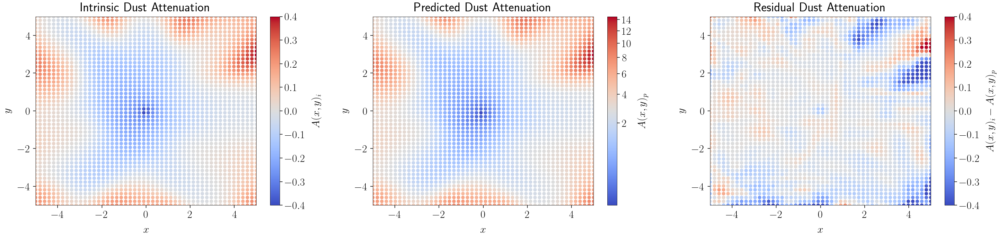

In [124]:
fig, ax = plt.subplots(1, 3, figsize=(40,10))
rcParams.update({'font.size': 30})
fig.subplots_adjust()
xlim, ylim = [X_MIN, X_MAX], [Y_MIN, Y_MAX]
applyPlotStyle2()
fig.colorbar(pcm, ax=ax[0], label=r'$A(x,y)_i$')
pcm = ax[0].scatter(Xgrid[:, 0], Xgrid[:, 1], c=Y, cmap='coolwarm', norm=matplotlib.colors.PowerNorm(gamma=.4), s = 80)
ax[0].set_xlabel(r'$x$')
ax[0].set_ylabel(r'$y$')
ax[0].set_xlim([xgrid[0], xgrid[-1]])
ax[0].set_ylim([ygrid[0], ygrid[-1]])
ax[0].set_title('Intrinsic Dust Attenuation')

pcm = ax[1].scatter(Xgrid[:, 0], Xgrid[:, 1], c=pred, norm=matplotlib.colors.PowerNorm(gamma=.4), cmap='coolwarm', s = 80)
fig.colorbar(pcm, ax=ax[1], label=r'$A(x,y)_p$')
ax[1].set_xlabel(r'$x$')
ax[1].set_ylabel(r'$y$')
ax[1].set_xlim([xgrid[0], xgrid[-1]])
ax[1].set_ylim([ygrid[0], ygrid[-1]])
ax[1].set_title('Predicted Dust Attenuation')

pcm = ax[2].scatter(Xgrid[:, 0], Xgrid[:, 1], c=Y - pred, cmap='coolwarm', s = 80, vmin=-0.4, vmax=0.4)
fig.colorbar(pcm, ax=ax[2], label=r'$A(x,y)_i - A(x,y)_p$')
ax[2].set_xlabel(r'$x$')
ax[2].set_ylabel(r'$y$')
ax[2].set_xlim([xgrid[0], xgrid[-1]])
ax[2].set_ylim([ygrid[0], ygrid[-1]])
ax[2].set_title('Residual Dust Attenuation')
plt.tight_layout()
plt.savefig('plots/CCS_Attenuation.png', bbox_inches='tight')

In [49]:
def differentiate(model, x, y):
    '''Return dA(r, phi)/r ie. return predicted integrated dust at (r - delta_r, phi) subtracted from predicted integrated dust at (r, phi)
    note: this is a single data point'''
    # finding x,y coordinate of point with r - delta
    pol = cart2pol(x, y)
    cart1 = [x,y]
    cart2 = pol2cart(pol[0] - 1e-4, pol[1])
    pred1 = model(np.array([cart1]), training=False) # NN prediction for integrated dust at r, phi
    pred2 = model(np.array([cart2]), training=False)  # NN prediction for integrated dust at r - delta_r, phi
    return (pred1 - pred2) / 1e-4

In [44]:
# ignoring derivative for now since with a ReLU those will be piecewise constant, so the choice of activation functions will matter there
intrinsic = [np.exp(logdust(x,y)) for x,y in X_test]
pred_finite_diff = [differentiate(model, x, y) for x,y in X_test] # predictions with finite difference method
pred = [model(X)[0][0] for X in X_test]

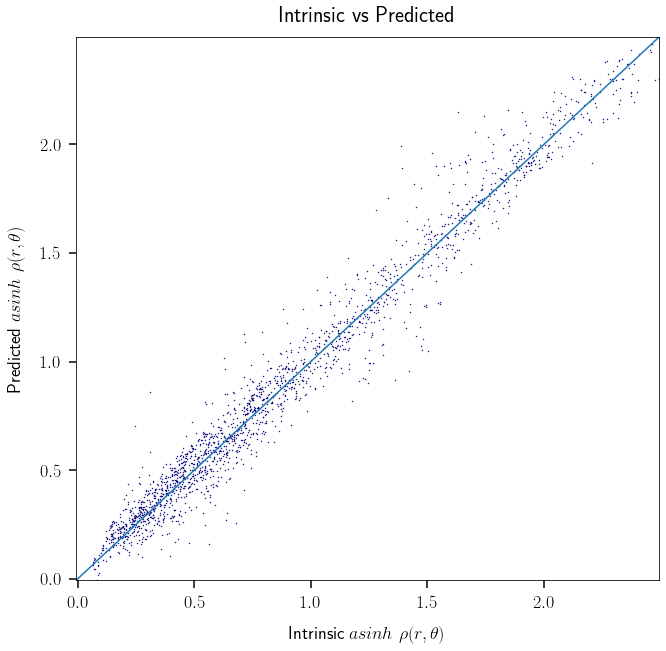

In [56]:
rcParams.update({'font.size': 18})
plt.figure(figsize=(23, 10))
plt.subplot(1, 2, 1)
applyPlotStyle2()
intrinsic_arcsinh = np.arcsinh(intrinsic)
pred_finite_diff_arcsinh = np.arcsinh(pred_finite_diff)
plt.scatter(intrinsic_arcsinh, pred_finite_diff_arcsinh, s=1, color='blue', linestyle='-', linewidth = 0.2, marker = 'D', edgecolor='black') 
plt.xlabel("Intrinsic " + r'$asinh$' + ' ' + r'$\rho(r, \theta)$')
plt.ylabel("Predicted " + r'$asinh$' + ' ' + r'$\rho(r, \theta)$')
lims = [min(np.amin(intrinsic_arcsinh), np.amin(pred_finite_diff_arcsinh)), max(np.amax(intrinsic_arcsinh), np.amax(pred_finite_diff_arcsinh))]
plt.xlim(lims)
plt.ylim(lims)
plt.plot(lims, lims)
plt.title('Intrinsic vs Predicted')
plt.savefig('3.png', bbox_inches='tight')

<ipython-input-67-deef1d6c77b3>:6: RuntimeWarning: invalid value encountered in log
  pred_asinh = np.log(pred_finite_diff)


2000
2500


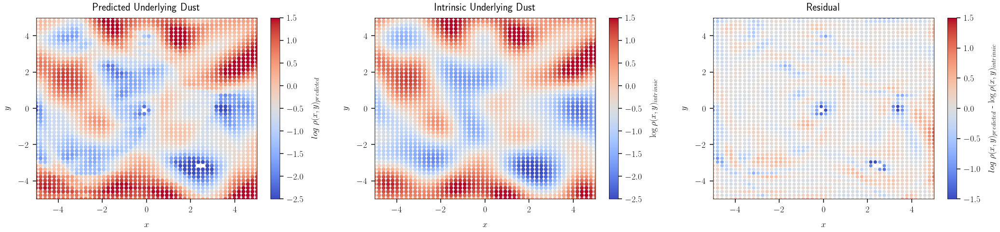

In [67]:

# Having some trouble gneerating full insrinsic map using finite diff - num inputs 
# plot underlying dust with predictions 
plt.figure(figsize=(30, 8))
plt.subplot(1, 3, 1)
# pred_finite_diff = [differentiate(model, x, y) for x,y in Xgrid]
pred_asinh = np.log(pred_finite_diff)
pred_asinh = [p[0][0] for p in pred_asinh]
print(len(X_test))
# plt.scatter(np.array(X_test_cart)[:, 0], np.array(X_test_cart)[:, 1], c=pred_asinh, cmap='coolwarm', s=5) #take log of dust
plt.scatter(Xgrid[:, 0], Xgrid[:, 1], c=pred_asinh, 
            cmap='coolwarm', s=50, vmin=-2.5, vmax=1.5)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.colorbar(label=r'$log$' + ' ' + r'$\rho(x, y)_{predicted}$')
plt.xlim([xgrid[0], xgrid[-1]])
plt.ylim([ygrid[0], ygrid[-1]])
plt.title('Predicted Underlying Dust')
plt.tight_layout(pad=1.)

plt.subplot(1, 3, 2)
plt.scatter(Xgrid[:, 0], Xgrid[:, 1], c=Ygrid_samps, 
                cmap='coolwarm', s=50, vmin=-2.5, vmax=1.5)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.colorbar(label=r'$\log \rho(x, y)_{intrinsic}$')
plt.title('Intrinsic Underlying Dust')
plt.xlim([xgrid[0], xgrid[-1]])
plt.ylim([ygrid[0], ygrid[-1]])

plt.subplot(1, 3, 3)
plt.scatter(Xgrid[:, 0], Xgrid[:, 1], c=pred_asinh - Ygrid_samps, 
            cmap='coolwarm', vmin=-1.5, vmax=1.5)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title('Residual')
plt.colorbar(label=r'$log$' + ' ' + r'$\rho(x, y)_{predicted}$' + ' - ' + r'$\log \rho(x, y)_{intrinsic}$')
plt.xlim([xgrid[0], xgrid[-1]])
plt.ylim([ygrid[0], ygrid[-1]])
plt.tight_layout(pad=3.0)
plt.savefig('predicted_vs_intrinsic_underlying_arcsinhdust.png', bbox_inches='tight')

# setting back the intrinsic set
# intrinsic = [np.exp(logdust(x,y)) for x,y in X_test_cart]
print(len(Ygrid_samps))
# print((pred_asinh))

In [125]:
dA_dx = []
dA_dy = []
norm = model.get_layer('norm')
dense_1 = model.get_layer('dense_1')
dense_2 = model.get_layer('dense_2')
dense_3 = model.get_layer('dense_3')
pred = model.get_layer('predictions')
for x,y in Xgrid:
    x_y = tf.constant([x, y])
    with tf.GradientTape() as g:
        g.watch(x_y)
        Y = pred(dense_3(dense_2(dense_1(norm(tf.convert_to_tensor([x_y]))))))
    dA_dxy = g.gradient(Y, x_y)
    # print(dA_dxy)
    dA_dx.append(dA_dxy[0])
    dA_dy.append(dA_dxy[1])
    
# for i in range(2500):
#     print(np.asarray(dA_dy)[i], np.asarray(dA_dx)[i])

In [135]:
r = np.sqrt(np.square(Xgrid[:, 0]) + np.square(Xgrid[:, 1]))
x = Xgrid[:, 0]
y = Xgrid[:, 1]
x_over_r = np.divide(x, r)
y_over_r = np.divide(y, r)
dA_dr = np.multiply(dA_dx, x_over_r) + np.multiply(dA_dy, y_over_r)

intrinsic = [np.exp(logdust(x,y)) for x,y in Xgrid]

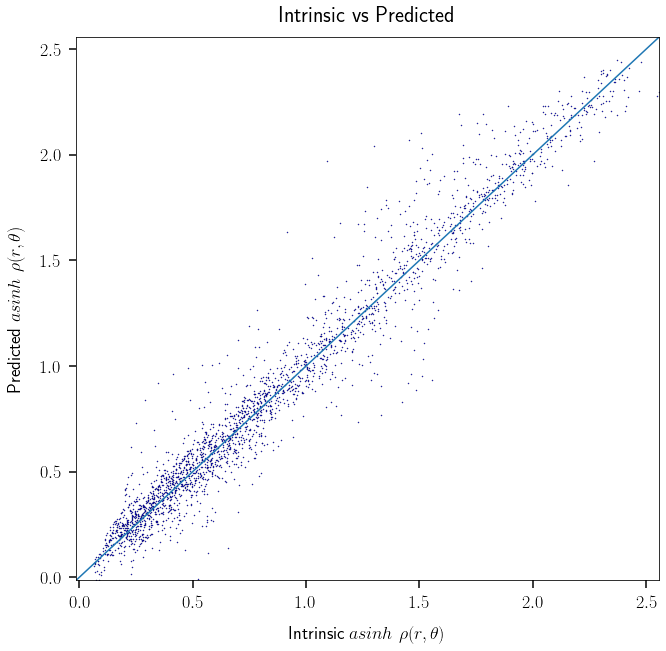

In [137]:
rcParams.update({'font.size': 18})
plt.figure(figsize=(23, 10))
plt.subplot(1, 2, 1)
applyPlotStyle2()
intrinsic_arcsinh = np.arcsinh(intrinsic)
dA_dr_asinh = np.arcsinh(dA_dr)
plt.scatter(intrinsic_arcsinh, dA_dr_asinh, s=1, color='blue', linestyle='-', linewidth = 0.2, marker = 'D', edgecolor='black') 
plt.xlabel("Intrinsic " + r'$asinh$' + ' ' + r'$\rho(r, \theta)$')
plt.ylabel("Predicted " + r'$asinh$' + ' ' + r'$\rho(r, \theta)$')
lims = [min(np.amin(intrinsic_arcsinh), np.amin(dA_dr_asinh)), max(np.amax(intrinsic_arcsinh), np.amax(dA_dr_asinh))]
plt.xlim(lims)
plt.ylim(lims)
plt.plot(lims, lims)
plt.title('Intrinsic vs Predicted')
plt.savefig('3.png', bbox_inches='tight')

<ipython-input-132-f6c07666c151>:6: RuntimeWarning: invalid value encountered in log
  pred_log = np.log(dA_dr)


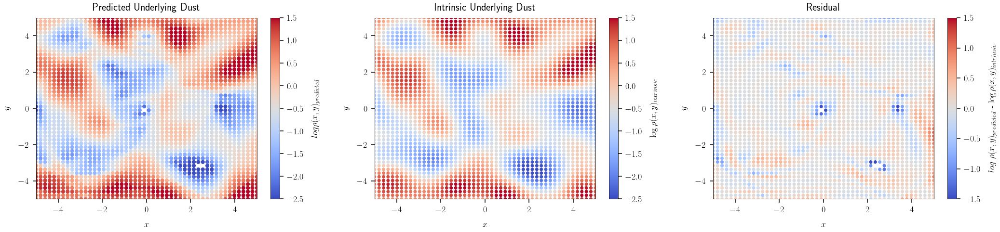

In [132]:
# plot underlying dust with predictions 
rcParams.update({'font.size': 18})
applyPlotStyle2()
plt.figure(figsize=(30, 8))
plt.subplot(1, 3, 1)
pred_log = np.log(dA_dr)
plt.scatter(Xgrid[:, 0], Xgrid[:, 1], c=pred_log, cmap='coolwarm', s=50, vmin=-2.5, vmax=1.5)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.colorbar(label=r'$log\rho(x, y)_{predicted}$')
plt.xlim([xgrid[0], xgrid[-1]])
plt.ylim([ygrid[0], ygrid[-1]])
plt.title('Predicted Underlying Dust')
plt.tight_layout(pad=1.)

plt.subplot(1, 3, 2)
plt.scatter(Xgrid[:, 0], Xgrid[:, 1], c=Ygrid_samps, cmap='coolwarm', vmin=-2.5, vmax=1.5)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.colorbar(label=r'$\log \rho(x, y)_{intrinsic}$')
plt.title('Intrinsic Underlying Dust')
plt.xlim([xgrid[0], xgrid[-1]])
plt.ylim([ygrid[0], ygrid[-1]])

plt.subplot(1, 3, 3)
plt.scatter(Xgrid[:, 0], Xgrid[:, 1], c=pred_log - Ygrid_samps, cmap='coolwarm', vmin=-1.5, vmax=1.5)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title('Residual')
plt.colorbar(label=r'$log$' + ' ' + r'$\rho(x, y)_{predicted}$' + ' - ' + r'$\log \rho(x, y)_{intrinsic}$')
plt.xlim([xgrid[0], xgrid[-1]])
plt.ylim([ygrid[0], ygrid[-1]])
plt.tight_layout(pad=3.0)
plt.savefig('predicted_vs_intrinsic_underlying_arcsinhdust.png', bbox_inches='tight')

# setting back the intrinsic set
# intrinsic = [np.exp(logdust(x,y)) for x,y in X_test_cart]